# EMSC3039/PHYS3039: Climate Dynamics
## Week 7 Computational Laboratory - Surface Fluxes

In this exercise you will learn how to access, download and analyse climate data from the ERA5 reanalysis product. These skills will assist you in completing the Major Assignment.

#### Assessment: 
Once you have worked through the notebook, enter the answer to Question 8 in the Week 7 Lab Wattle Quiz. You do not need to submit the notebook. 


### ERA5 Data

The first step is to get an account with Copernicus Data Service
https://cds.climate.copernicus.eu/user/register

You are then able to download data through their graphical interface.

There are multiple types of ERA5 data:

#### 2D data
##### ERA5 monthly averaged data on single levels from 1940 to present
https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels-monthly-means

This data is global lat-lon fields at the surface and top-of-atmosphere, averaged over one month.

##### ERA5 hourly data on single levels from 1940 to present
https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels

As above, but averaged over one hour rather than one month.

#### 3D data
This data is very BIG. Recommend you minimise use as much as possible.
##### ERA5 monthly averaged data on pressure levels from 1940 to present
https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-pressure-levels-monthly-means

This data is global lat-lon-pressure fields, averaged over one month. In other words, it is 3D data extending from the surface to the top-of-atmosphere at all lat-lon locations.

##### ERA5 hourly data on pressure levels from 1940 to present
https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-pressure-levels

As above, but averaged over one hour rather than one month.

## Downloading data
We will now go through an example of how to download and analyse some surface flux data. We will use hourly data for a single day.

To download:
1. Go to https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels and login
2. Click the Download Data tab
3. Select: Product type = reanalysis
4. Select: Mean rates = Mean surface sensible heat flux, Mean surface latent heat flux, Mean surface net longwave radiation, Mean surface net shortwave radiation, AND Other = Land-sea mask
5. Select: Jan 01 2022.
6. Select: all 24 hours 00:00-23:00
7. Select: format = NetCDF
8. Click Submit Form
9. Wait for your Download to be ready. Then click Download, and put the file in the same folder as this notebook.

#### Note: I STRONGLY RECOMMEND you download this data in advance of the lab session. Download speeds will be very slow if everyone tries to download at once.

## Analysing data
Load the necessary packages to analyse the data. Here we will use xarray, but you are welcome to use any method you wish. For xarray, you might find the tutorial here helpful:
https://tutorial.xarray.dev/overview/xarray-in-45-min.html

If you get an error loading packages, you may need to install them. If you are using Anaconda as your Python installation on your personal computer (recommended), the instructions to do so may be found here:
https://docs.anaconda.com/free/anacondaorg/user-guide/packages/installing-packages/

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

We now open the downloaded file using xarray. You will need to replace the filename with whatever your download is called.

In [2]:
dsx=xr.open_dataset('surface_fluxes_hourly_Jan1_2022.nc')

It is helpful to have a look at what is in the data file. Click on the 'page' icon to see more information about each variable.

In [3]:
dsx

<xarray.Dataset>
Dimensions:    (longitude: 1440, latitude: 721, time: 24)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.0 359.2 359.5 359.8
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * time       (time) datetime64[ns] 2022-01-01 ... 2022-01-01T23:00:00
Data variables:
    lsm        (time, latitude, longitude) float32 ...
    mslhf      (time, latitude, longitude) float32 ...
    msnlwrf    (time, latitude, longitude) float32 ...
    msnswrf    (time, latitude, longitude) float32 ...
    msshf      (time, latitude, longitude) float32 ...
    mtpr       (time, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2024-01-16 21:40:12 GMT by grib_to_netcdf-2.25.1: /opt/ecmw...

#### Question 1: 
Using the above dataset information determine:

a) What are the units of each variable?

b) What is the spatial resolution of the data?

Answer here...

### Data exploration

We can make a animation of the data like this showing how the spatial field evolves in time (Note that you will need the hvplot package). 

You can pan and zoom within this animation, using the controls to the right. 

This is a great way to explore your data.

In [4]:
import hvplot.xarray
dsx['msnswrf'].hvplot(groupby="time", clim=(0,800), widget_location='bottom',width=600, widget_type='scrubber',x='longitude',y='latitude',colormap='jet')

Column
    [0] HoloViews(DynamicMap, height=300, sizing_mode='fixed', widget_location='bottom', widget_type='scrubber', width=600)
    [1] WidgetBox(align=('center', 'end'))
        [0] Player(end=23, width=550)

#### Question 2:

The above animation shows the net shortwave radiation at the surface. Can you explain the structures you see in terms of: time of year, surface properties or cloud cover? In particular, why is the shortwave radiation so low over Antarctica when it is the middle of summer?

Answer here....

### Plotting

We can also make more traditional plots at a fixed time as follows. We will superimpose the coastlines by plotting the 0.5 contour of the land-sea mask:

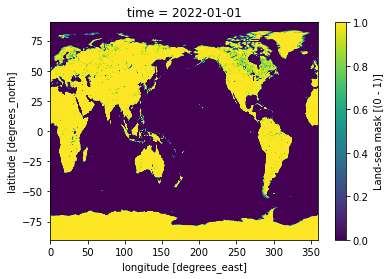

In [5]:
# Plot the land-sea mask
dsx['lsm'].isel(time=0).plot()

Now we plot each of the four surface fluxes as a contour map, and overlay the coastlines.

The .isel(time=ti) with ti=0 command pulls out the first time in the array (i.e., 00:00) for plotting. Try changing ti to get plots for different times.

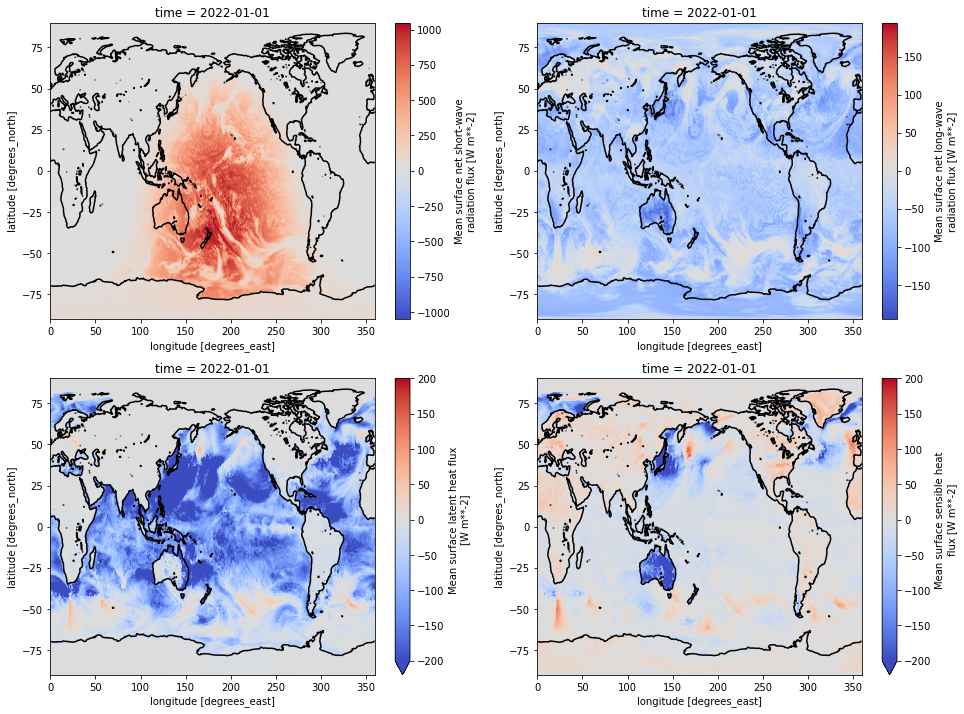

In [6]:
ti=0

plt.figure(figsize=(16,12))

plt.subplot(2,2,1)
dsx['msnswrf'].isel(time=ti).plot(cmap='coolwarm')
dsx['lsm'].isel(time=0).plot.contour(levels=[0.5],colors='k')

plt.subplot(2,2,2)
dsx['msnlwrf'].isel(time=ti).plot(cmap='coolwarm')
dsx['lsm'].isel(time=0).plot.contour(levels=[0.5],colors='k')

plt.subplot(2,2,3)
dsx['mslhf'].isel(time=ti).plot(vmin=-200,vmax=200,cmap='coolwarm')
dsx['lsm'].isel(time=0).plot.contour(levels=[0.5],colors='k')

plt.subplot(2,2,4)
dsx['msshf'].isel(time=ti).plot(vmin=-200,vmax=200,cmap='coolwarm')
dsx['lsm'].isel(time=0).plot.contour(levels=[0.5],colors='k')

#### Question 3:

Which of the above surface fluxes have the most obvious differences between land and ocean surfaces? Which don't seem to differ at all? Why?

Answer here...

### Basic analysis

Let's start by making some averages across longitude and time.

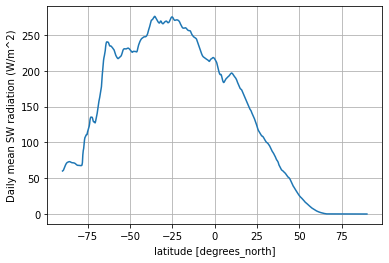

In [7]:
dsx['msnswrf'].mean(dim='time').mean(dim='longitude').plot()
plt.ylabel('Daily mean SW radiation (W/m^2)')
plt.grid()

We can do this for all the fields, and plot together

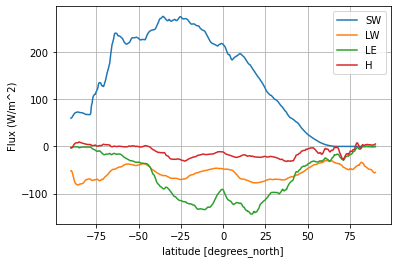

In [8]:
# Give them some names
SW=dsx['msnswrf']
LW=dsx['msnlwrf']
LE=dsx['mslhf']
H=dsx['msshf']

# take some means and plot
SW.mean(dim='time').mean(dim='longitude').plot(label='SW')
LW.mean(dim='time').mean(dim='longitude').plot(label='LW')
LE.mean(dim='time').mean(dim='longitude').plot(label='LE')
H.mean(dim='time').mean(dim='longitude').plot(label='H')
plt.ylabel('Flux (W/m^2)')
plt.grid()
plt.legend()

#### Question 4:
Add another line to the above plot which shows the net ground heat flux $G=SW+LW+H+LE$. Does a positive sign mean IN TO or OUT OF the surface?

In [14]:
## Answer here
G=SW+LW+LE+H


You can use the land-sea mask to restrict your analysis to only land, or only ocean, as follows.

Text(0, 0.5, 'Flux (W/m^2)')

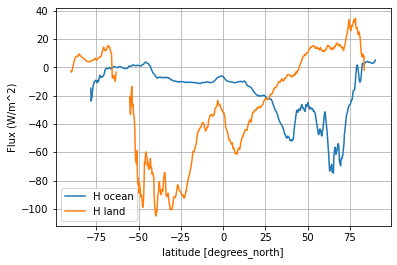

In [15]:
# only ocean
H.where(dsx['lsm']<0.5).mean(dim='time').mean(dim='longitude').plot(label='H ocean')
# only land
H.where(dsx['lsm']>0.5).mean(dim='time').mean(dim='longitude').plot(label='H land')
plt.grid()
plt.legend()
plt.ylabel('Flux (W/m^2)')

We're now going to compute the total energy flux over the globe. To do this, we need account for the area of the different grid cells. Because latitude and longitude correspond to spherical coordinates for Earth’s surface, each 0.25x0.25 degree grid cell actually has a different surface area as you move away from the equator! This is because latitudinal length is fixed ($ R \Delta \phi$), but longitudinal length varies with latitude ($R \Delta \theta \cos \theta$)

So the area element for lat-lon coordinates is

$\Delta A=R^2 \Delta \theta \Delta \phi \cos \theta$

where 
$\theta$ is latitude, 

$\Delta \theta$ is the spacing of the points in latitude, 

$\Delta \phi$ is the spacing of the points in longitude, and 

$R$ is Earth’s radius. 

In this formula, $\theta$ and $\phi$ are measured in radians.

In [16]:
# Earth's average radius in meters
R = 6.371e6

# Coordinate spacing for this dataset is 0.25 x 0.25 degrees
dphi = np.deg2rad(0.25)
dtheta = np.deg2rad(0.25)

dlat = R * dtheta * xr.ones_like(dsx['longitude'])
dlon = R * dphi * np.cos(np.deg2rad(dsx['latitude']))
cell_area = dlon * dlat
## this sums all the cell areas.
cell_area.sum()

<xarray.DataArray ()>
array(5.100636e+14, dtype=float32)

#### Question 5: 

Does the above sum over cell areas give you the correct area for the Earth? (i.e., $4\pi R^2$)

Add some more code below to add up the area of the ocean ONLY.

In [17]:
## Answer here


Now suppose you want to compute an average flux over the globe. This is the sum of the flux at each grid cell multiplied by the area of that cell, divided by the total area:

In [18]:
sw1=(SW*cell_area).mean(dim='time').sum()/cell_area.sum()
lw1=(LW*cell_area).mean(dim='time').sum()/cell_area.sum()
h1=(H*cell_area).mean(dim='time').sum()/cell_area.sum()
le1=(LE*cell_area).mean(dim='time').sum()/cell_area.sum()
g1=(G*cell_area).mean(dim='time').sum()/cell_area.sum()
print('mean flux over the Earth is SW=',sw1.values, 'LW=',lw1.values, 'H=',h1.values,'LE=',le1.values,'G=',g1.values, 'W/m^2')

mean flux over the Earth is SW= 168.92676 LW= -56.61817 H= -15.336654 LE= -83.74807 G= 13.22385 W/m^2


#### Question 6:

Calculate the mean flux over the land and ocean seperately.

Now suppose we want to calculate the daily cycle of mean fluxes over continental Australia. Let's start with the sensible heat flux.

First, we need to define Australia. By looking at the (interactive) map of land-sea mask below, let's define Australia as land areas with latitudes $-45<\theta<-10.5$ and longitudes $112<\phi<155$.

In [19]:
# Interactive hvplot of the land-sea mask
dsx['lsm'].isel(time=0).hvplot(x='longitude',y='latitude')

:Image   [longitude,latitude]   (lsm)

Now create a new array for the cell area associated with Australia, and check it works by plotting the result.

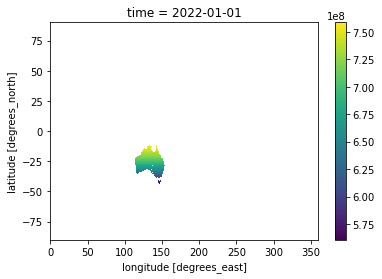

In [20]:
cell_area_AU=cell_area.where(dsx['lsm']>0.5).where(dsx['latitude']<-10.5).where(dsx['latitude']>-45).where(dsx['longitude']<155).where(dsx['longitude']>112)
cell_area_AU.isel(time=0).plot()

Now do the same weighted sum we did above for the global average, and plot the resulting time series of mean sensible heat flux over Australia.

Text(0, 0.5, 'sensible heat flux (W/m^2)')

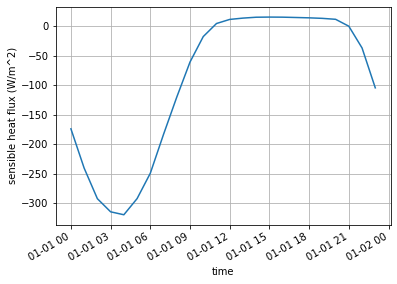

In [21]:
H_AU=(H*cell_area_AU).sum(dim='latitude').sum(dim='longitude')/cell_area_AU.isel(time=0).sum()
H_AU.plot()
plt.grid()
plt.ylabel('sensible heat flux (W/m^2)')

#### Question 7:

Repeat the above procedure to add lines for the other fluxes (SW, LE, LW, G) to the plot.

Which flux is largest in the daytime and nighttime?

In [22]:
## Answer here


#### Question 8:
What is the peak hourly net shortwave flux averaged over Australia on Jan 1 2022 according to ERA5? Enter this value (in W/m^2) in the Wattle quiz to complete this weeks lab. 

Hint: use the .max() command.

In [23]:
# calculate the answer here

#### Further exercises:
1. Repeat a similar analysis to the above, but using the monthly mean ERA5 data over one year (or multiple years).
2. Repeat the Australian continent analysis for a different geographic region, or subsets of Australia.
3. Investigate some of the other fields available in the ERA5 data that are relevant to this week's course material; e.g., 'significant wave height' under 'ocean waves'
4. Start thinking about your research project Major Assignment!